<div align="center">
  <img src="https://sharedeconomycpa.com/wp-content/uploads/2018/08/Airbnb-NYC-law.jpg" />
</div>

# 1. Introdução e Metadados

### 1.1. Contexto e Fontes de Dados

Os dados foram obtidos a partir da plataforma [Kaggle](https://www.kaggle.com/), em um dataset público compilado por Arian Azmoudeh.

- **Fonte Principal:** [New York City Airbnb Open Data](https://www.kaggle.com/datasets/arianazmoudeh/airbnbopendata).

- **Fonte Original:** Os dados são derivados da iniciativa [Inside Airbnb](https://insideairbnb.com/explore/), que disponibiliza dados públicos sobre as listagens da plataforma em várias cidades do mundo.

### Sobre o Airbnb

O Airbnb é uma plataforma que conecta pessoas que desejam alugar um espaço (como casas, apartamentos ou quartos) com viajantes em busca de acomodações temporárias. O serviço permite que anfitriões anunciem suas propriedades e que hóspedes reservem estadias, muitas vezes com preços mais acessíveis do que em hotéis tradicionais.

### 1.2. Sobre o Dataset e Estrutura

O dataset descreve a atividade de anúncios de acomodações na cidade de Nova York. As informações abrangem três áreas principais:

- **Anúncios (Listings):** Inclui descrições completas dos imóveis, localização geográfica (latitude e longitude), tipo de quarto, preço, regras da casa e informações sobre o anfitrião.
- **Avaliações (Reviews):** Contém dados sobre o número de avaliações, a data da última avaliação e a pontuação média das avaliações.
- **Disponibilidade (Calendar):** Informações sobre a disponibilidade do imóvel ao longo do ano (availability_365).

A escolha deste conjunto de dados se deve à sua riqueza de informações, que nos permite explorar diversas áreas do mercado de aluguel de curto prazo em Nova York.
Dentre as várias opções analisadas, este dataset se destacou por apresentar um cenário completo e realista para um projeto de Ciência de Dados: ele combina um grande volume de registros com desafios claros de tratamento e limpeza.

Uma análise preliminar já nos permitiu identificar diversos pontos de melhoria, que encaramos como oportunidades para demonstrar um fluxo de trabalho robusto. Ao invés de um dataset perfeitamente limpo, a necessidade de prepará-lo nos permite agregar mais valor e confiança à análise final. Objetivo é ir além da simples visualização de dados, buscando insights sobre como diferentes variáveis se relacionam e influenciam o ecossistema do Airbnb.

# 2. Análise Exploratória

Para a nossa análise, utilizaremos um conjunto de bibliotecas do ecossistema Python que se complementam.

* **Manipulação e Análise de Dados**
    A base do trabalho é a biblioteca [`pandas`](https://pandas.pydata.org/), que nos permite carregar e alterar dados usando `DataFrames` (tabelas) e `Series` (colunas). Para dados que contêm informações geográficas, como coordenadas, usaremos a [`geopandas`](https://geopandas.org/), que funciona como uma extensão do `pandas`.

* **Visualização de Dados e Mapas**
    Para desenhar gráficos, a biblioteca fundamental é a [`matplotlib`](https://matplotlib.org/). Sobre ela, podemos usar a [`seaborn`](https://seaborn.pydata.org/) para criar visualizações estatísticas mais ricas. Quando precisamos de interatividade, a [`plotly.express`](https://plotly.com/python/plotly-express/) é uma ótima opção. Para os mapas, a biblioteca [`folium`](https://python-visualization.github.io/folium/) nos permite visualizar dados geográficos de forma interativa.

* **Computação Numérica e Utilitários**
    Por trás de muitas operações de dados, a biblioteca [`numpy`](https://numpy.org/) é fundamental para cálculos numéricos eficientes com seus arrays. Além dela, teremos o auxílio de bibliotecas como `os` para interagir com arquivos, `joblib` para salvar nossos modelos, e `pycountry` e `reverse_geocoder` para nos ajudar a entender e padronizar dados de localização.

* **Machine Learning**
    Para a criação de modelos preditivos, a principal ferramenta será a [`scikit-learn`](https://scikit-learn.org/). Dela, importamos algoritmos como `LinearRegression` e `RandomForestRegressor`, que nos permitem treinar modelos capazes de realizar previsões.

## 2.1 Importação das bibliotecas

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import MaxNLocator
import numpy as np
import folium
from folium.plugins import FastMarkerCluster
from IPython.display import display
import pycountry
import plotly.express as pxa
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from branca.element import Template, MacroElement
from folium.plugins import HeatMap
import reverse_geocoder as rg
from sklearn.ensemble import RandomForestRegressor
import joblib
import os
from sklearn.linear_model import LinearRegression

In [47]:
df = pd.read_csv("./airbnb-dataset-silver.csv", sep=",", encoding='utf8', low_memory=False)

## 2.2 Head do Dataset

A tabela abaixo mostra de maneira breve o dataframe utilizado nesse projeto:


In [3]:
df.head(3)

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,has_house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,False,Madaline,Brooklyn,Kensington,40.64749,-73.97237,False,...,193.0,10,9,2021-10-19,0.21,4.0,6,286,Clean up and treat the home the way you'd like...,True
1,1002102,Skylit Midtown Castle,52335172823,True,Jenna,Manhattan,Midtown,40.75362,-73.98377,False,...,28.0,30,45,2022-05-21,0.38,4.0,2,228,Pet friendly but please confirm with me if the...,True
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,True,Elise,Manhattan,Harlem,40.80902,-73.94190,True,...,124.0,3,0,NaN,NaN,5.0,1,352,"I encourage you to use my kitchen, cooking and...",True


## 2.3 Dimensões do Dataset

A dimensão do dataset foi reduzida após o processo de limpeza. Essa diminuição é resultado da exclusão de linhas com dados ausentes e da remoção de colunas consideradas não significativas para a análise.

In [48]:
linhas, colunas = df.shape

print(f"Número de tuplas: {linhas}")
print(f"Número de colunas: {colunas}")

Número de tuplas: 99449
Número de colunas: 24


## 2.4 Identificação das Colunas e Tipos de Dados

No nosso ETL, as colunas foram normalizadas. A coluna 'name', por exemplo, antes era 'NAME', e a coluna 'neighbourhood_group' antes possuía um espaço, sendo 'neighbourhood group'.

Além disso, não existem mais colunas com o tipo object, pois os valores ausentes foram removidos e os valores incompatíveis também. Os tipos de dados foram corrigidos durante o processo de ETL.

In [49]:
df.columns

Index(['id', 'name', 'host_id', 'host_identity_verified', 'host_name',
       'neighbourhood_group', 'neighbourhood', 'lat', 'long',
       'instant_bookable', 'cancellation_policy', 'room_type',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365', 'house_rules', 'has_house_rules'],
      dtype='object')

In [6]:
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_identity_verified               bool
host_name                          object
neighbourhood_group                object
neighbourhood                      object
lat                               float64
long                              float64
instant_bookable                     bool
cancellation_policy                object
room_type                          object
construction_year                   int64
price                             float64
service_fee                       float64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
review_rate_number                float64
calculated_host_listings_count      int64
availability_365                    int64
house_rules                        object
has_house_rules                   

## 2.5 Qualidade dos Dados

### 2.5.1 Análise de Valores Ausentes (Nulos/NaN)

#### Dados não nulos

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99449 entries, 0 to 99448
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              99449 non-null  int64  
 1   name                            99449 non-null  object 
 2   host_id                         99449 non-null  int64  
 3   host_identity_verified          99449 non-null  bool   
 4   host_name                       99449 non-null  object 
 5   neighbourhood_group             99449 non-null  object 
 6   neighbourhood                   99449 non-null  object 
 7   lat                             99449 non-null  float64
 8   long                            99449 non-null  float64
 9   instant_bookable                99449 non-null  bool   
 10  cancellation_policy             99396 non-null  object 
 11  room_type                       99449 non-null  object 
 12  construction_year               

#### Dados nulos

In [8]:
df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_identity_verified                0
host_name                             0
neighbourhood_group                   0
neighbourhood                         0
lat                                   0
long                                  0
instant_bookable                      0
cancellation_policy                  53
room_type                             0
construction_year                     0
price                                 0
service_fee                           0
minimum_nights                        0
number_of_reviews                     0
last_review                       15198
reviews_per_month                 15197
review_rate_number                    0
calculated_host_listings_count        0
availability_365                      0
house_rules                           0
has_house_rules                       0
dtype: int64

#### Tuplas com pelo menos um valor ausente (Nulos/NaN)

In [50]:
number_of_rows_with_null_nan_values = len(df.isnull().any(axis=1))
print(f"Número de registros com pelo menos um valor nulo ou nan: {number_of_rows_with_null_nan_values}")

Número de registros com pelo menos um valor nulo ou nan: 99449


#### Porcentagem de nulos por coluna

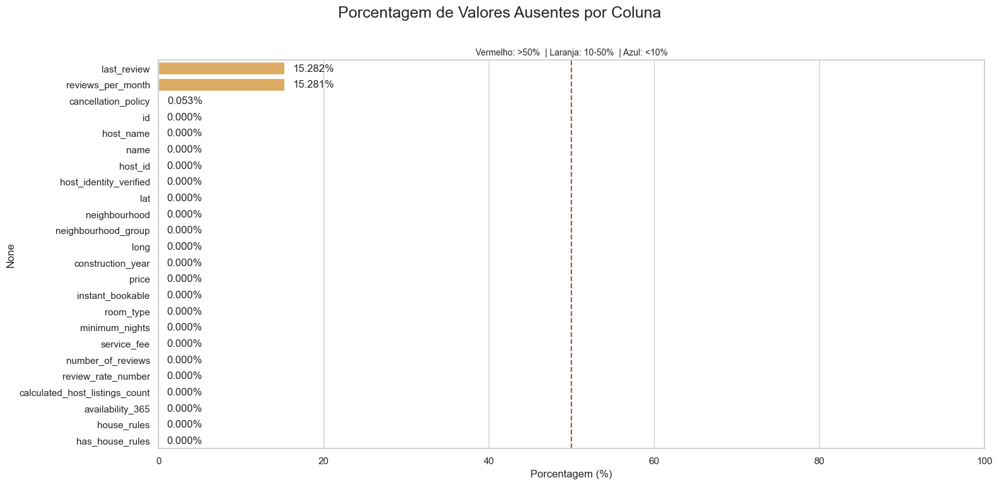

In [10]:
null_perc = (df.isnull().sum() / len(df) * 100).sort_values(ascending=False)

colors = ['#d9534f' if v > 50 else '#f0ad4e' if v > 10 else '#5bc0de' for v in null_perc.values]

sns.set_theme(style="whitegrid")
plt.figure(figsize=(16, 8))
ax = sns.barplot(x=null_perc.values, y=null_perc.index, hue=null_perc.index, palette=colors, legend=False)

plt.suptitle("Porcentagem de Valores Ausentes por Coluna", fontsize=18, y=0.96)
ax.set_title("Vermelho: >50%  | Laranja: 10-50%  | Azul: <10%", fontsize=10)
ax.set_xlabel("Porcentagem (%)")
ax.set_xlim(0, 100)

for p in ax.patches:
    w = p.get_width()
    ax.text(w + 1, p.get_y() + p.get_height()/2, f'{w:.3f}%', va='center')

ax.axvline(50, color='darkred', linestyle='--', alpha=0.7)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Observemos algumas colunas com dados interessantes: 

- **license**: A coluna license tem apenas 2 registros que não vem com valor nulo. Todos os outros são nulos. O que torna esse campo tão importante? Por que a esmagadora maioria não precisa de uma licensa? E por que especificamente 2 anúncios tem? Existe algo que torna esses anúncios diferentes dos demais?
- **house_rules**: A coluna house_rules tem quase metade dos seus valores como nulos. Ou seja: metade dos aluguéis não vêm com regras explícitas.
- **last review**: mais de 80% dos anúncios teve pelo menos uma avaliação.
- **country** e **country code**: embora saibamos que os dados se referem sempre à cidade de Nova York, ainda assim existem registros que não indicam que o país do anúncio é os Estados Unidos.
- **id** e **name**: nenhum dos registros não tem identificador. No entanto, ainda existem registros que não tem nome (embora sejam de quantidade quase desprezível). O que levanta a pergunta: o site do airbnb permitiu anúncios sem nome? Ou houve falha no momento da extração dos dados?
- **long**, **lat**, **neighbourhood** e **neighbourhood group**: apenas 8 registros não tem latitude e longitude, mas o dobro de registros não pertence a nenhum bairro, e quase o triplo não pertence a nenhum grupo de bairro. Isso é importante porque `neighbourhood` e `neighbourhood group` são gerados a partir dos valores de latitude e longitude. Se apenas 8 registros não têm esses valores, por que 16 não tem bairro definido e 29 não tem um grupo de bairro definido?
- **price**: pouquíssimos registros não tem um preço definido. Como alguém faria um aluguel sem saber por quanto seria?

#### Distribuição de dados ausentes

<Axes: >

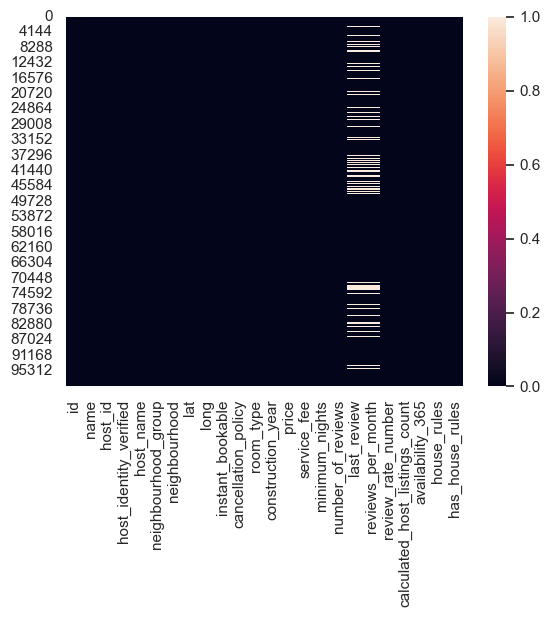

In [11]:
sns.heatmap(df.isnull())

### 2.5.2 Identificação de Registros Duplicados

Esta seção apresenta a análise da presença de dados duplicados no dataset.

É notável que, após a etapa de remoção no processo de ETL, o conjunto de dados está completamente livre de duplicatas. A validação dessa limpeza é confirmada por múltiplos indicadores:

* O **total** de registros duplicados é igual a **0**.
* A **amostra** de tuplas duplicadas está vazia.
* A **proporção** de duplicatas é de **0%**, indicando que 100% dos registros são únicos.
* O **gráfico de distribuição** confirma visualmente a ausência de entradas duplicadas.

#### Total de tuplas com id's duplicados

In [12]:
total = len(df)
dups = df.duplicated().sum()

print(f"Total de linhas: {total}")
print(f"Total de duplicadas: {dups}")

Total de linhas: 99449
Total de duplicadas: 0


#### Amostra das tuplas duplicadas

In [13]:
resumo = (
    df.groupby([c for c in df.columns if c != "id"], dropna=False)
      .agg(ids=("id", list),
           ocorrencias=("id", "size"),
           posicoes=("id", lambda s: list(s.index)))
      .reset_index()
      .query("ocorrencias > 1")
      .sort_values("ocorrencias", ascending=False)
)

resumo = resumo[["ids","name","ocorrencias","posicoes"] + 
                [c for c in resumo.columns if c not in ["ids","name","ocorrencias","posicoes"]]]
resumo

,ids,name,ocorrencias,posicoes,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,has_house_rules


#### Proporção entre duplicados e únicos:

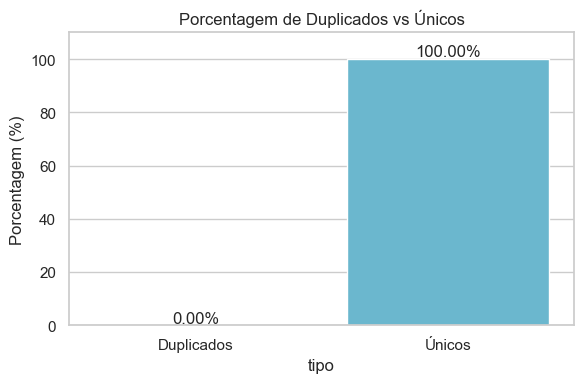

In [14]:
total = len(df)
dups = df.duplicated().sum()
stats = pd.DataFrame({
    "tipo": ["Duplicados", "Únicos"],
    "porcentagem": pd.Series([dups, total - dups]) / total * 100
})

sns.set_theme(style="whitegrid")
plt.figure(figsize=(6,4))
ax = sns.barplot(
    data=stats,
    x="tipo", y="porcentagem",
    hue="tipo", palette=["#d9534f", "#5bc0de"],
    legend=False
)

for p in ax.patches:
    h = p.get_height()
    ax.text(p.get_x()+p.get_width()/2, h+1, f"{h:.2f}%", ha="center")

ax.set_title("Porcentagem de Duplicados vs Únicos")
ax.set_ylabel("Porcentagem (%)")
plt.ylim(0, 110)
plt.tight_layout()
plt.show()

#### Distribuição das duplicadas:

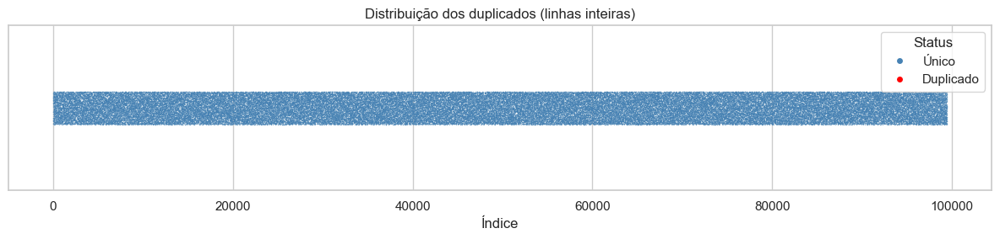

In [15]:
alpha_unico, size_unico = 0.5, 1
alpha_dup, size_dup = 1, 1

plot_df = pd.DataFrame({
    "Índice": df.index,
    "Duplicado": df.duplicated(keep=False).map({True: "Duplicado", False: "Único"})
})

fig, ax = plt.subplots(figsize=(12, 3))
sns.stripplot(data=plot_df[plot_df.Duplicado=="Único"],x="Índice",y=[""]*plot_df.Duplicado.eq("Único").sum(),
              color="steelblue",alpha=alpha_unico,size=size_unico,ax=ax)
sns.stripplot(data=plot_df[plot_df.Duplicado=="Duplicado"],x="Índice",y=[""]*plot_df.Duplicado.eq("Duplicado").sum(),
              color="red",alpha=alpha_dup,size=size_dup,ax=ax)

legend_elements=[Line2D([0],[0],marker='o',color='w',label='Único',markerfacecolor='steelblue',markersize=6),
                 Line2D([0],[0],marker='o',color='w',label='Duplicado',markerfacecolor='red',markersize=6)]
ax.legend(handles=legend_elements,title="Status",loc="upper right")

plt.title("Distribuição dos duplicados (linhas inteiras)")
plt.xlabel("Índice");plt.ylabel("")
plt.tight_layout();plt.show()

### 2.5.3 Resumo Estatístico Descritivo das Colunas

In [16]:
df.drop(columns=["id", "host_id"]).describe()

,lat,long,construction_year,price,service_fee,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
count,99449.000000,99449.000000,99449.000000,99449.000000,99449.000000,99449.000000,99449.000000,84252.000000,99449.000000,99449.000000,99449.000000
mean,40.728029,-73.949595,2012.487939,625.541836,125.109212,8.103993,27.286589,1.377165,3.280998,7.968788,141.346580
std,0.055871,0.049595,5.761819,331.671467,66.337659,28.446072,49.078044,1.747959,1.283651,32.394743,135.334701
min,40.499790,-74.249840,2003.000000,50.000000,10.000000,1.000000,0.000000,0.010000,1.000000,1.000000,0.000000
25%,40.688690,-73.982560,2008.000000,340.000000,68.000000,2.000000,1.000000,0.220000,2.000000,1.000000,3.000000
50%,40.722220,-73.954430,2012.000000,625.000000,125.000000,3.000000,7.000000,0.740000,3.000000,1.000000,97.000000
75%,40.762750,-73.932270,2017.000000,913.000000,183.000000,5.000000,30.000000,2.010000,4.000000,2.000000,269.000000
max,40.916970,-73.705220,2022.000000,1200.000000,240.000000,5645.000000,1024.000000,90.000000,5.000000,332.000000,3677.000000


**1. Localização e Idade dos Imóveis:**

* As coordenadas de latitude (`lat`) e longitude (`long`) estão concentradas em uma área geográfica específica (média de 40.72, -73.94), mostrando que os dados são de **Nova York**.
* Os imóveis são relativamente modernos, com o ano de construção (`construction_year`) variando de **2003 a 2022**, sendo a média e a mediana em 2012.

**2. Preços e Taxas:**

* O preço da diária (`price`) varia significativamente, indo de 50 a 1200, com uma média de 625.
* A taxa de serviço (`service_fee`) acompanha o preço, com uma média de 125.

**3. Padrões de Reserva e Disponibilidade:**

* A maioria das acomodações exige um mínimo de **3 noites** (`minimum_nights`), como visto na mediana.
* A disponibilidade anual (`availability_365`) tem uma média de 141 dias.

**4. Avaliações e Popularidade:**

* A nota de avaliação (`review_rate_number`) vai de **1 a 5**, com uma média de 3.28.
* A maioria dos imóveis tem poucas avaliações (mediana de 7), mas alguns são extremamente populares, com o máximo chegando a **1.024 avaliações** (`number_of_reviews`).

**5. Perfil dos Anfitriões:**

* A maioria dos anfitriões (`calculated_host_listings_count`) possui apenas **1 imóvel** (mediana). A média de quase 8 imóveis é influenciada por uma minoria de anfitriões com um grande número de propriedades (até 332).

### 2.5.4 Problemas de Formato

Confirmando se o tratamento da coluna de preço foi bem-sucedido: remoção do '$' e conversão para o tipo float64

In [17]:
primeiros_valores = df[['price', 'service_fee']].head()

print(primeiros_valores)

print("\nTipos de dados das colunas:")
print(df[['price', 'service_fee']].dtypes)

   price  service_fee
0  966.0        193.0
1  142.0         28.0
2  620.0        124.0
3  368.0         74.0
4  204.0         41.0

Tipos de dados das colunas:
price          float64
service_fee    float64
dtype: object


### 2.5.5 Valores Inconsistentes (Outliers negativos)

Verificando a presença de valores negativos em colunas onde não são esperados, com exceção de Latitude e Longitude.

In [18]:
df_numeric = df.select_dtypes(include=np.number)
contagem_negativos = (df_numeric < 0).sum()
colunas_e_contagem = contagem_negativos[contagem_negativos > 0]

print("Contagem de valores negativos por coluna:")
print(colunas_e_contagem)

Contagem de valores negativos por coluna:
long    99449
dtype: int64


### 2.5.6 Valores Inconsistentes na coluna 'availability_365'

Verificando a existência de valores maiores que 365, o que é impossível, já que a coluna representa quantos dias estão disponíveis dentro de um período de um ano.

In [54]:
outliers_disponibilidade = df[df['availability_365'] > 365]

print(f"Encontrados {len(outliers_disponibilidade)} registros com disponibilidade > 365 dias.")
print(outliers_disponibilidade.head())

Encontrados 2660 registros com disponibilidade > 365 dias.
         id                                               name      host_id  \
5   1004098          Large Cozy 1 BR Apartment In Midtown East  45498551794   
9   1006307                 Cozy Clean Guest Room - Family Apt  75527839483   
20  1015144             MAISON DES SIRENES1,bohemian apartment  48387947293   
27  1025085                  1bdr w private bath. in lofty apt  45597582469   
33  1062089  Sunny 2-story Brooklyn townhouse w deck and ga...  85201462079   

    host_identity_verified host_name neighbourhood_group       neighbourhood  \
5                     True  Michelle           Manhattan         Murray Hill   
9                    False      Carl           Manhattan     Upper West Side   
20                    True   Miranda            Brooklyn  Bedford-Stuyvesant   
27                    True   Charlie            Brooklyn         Fort Greene   
33                    True      Alen            Brooklyn          

### 2.5.7 Valores Inconsistentes na coluna 'minimum_nights'

Verificando a existência de valores extremamente altos em minimum_nights (ex: maiores que 1000 dias). Embora não seja estritamente impossível, um valor tão elevado é improvável e sugere um erro de inserção ou que o imóvel não está de fato disponível.

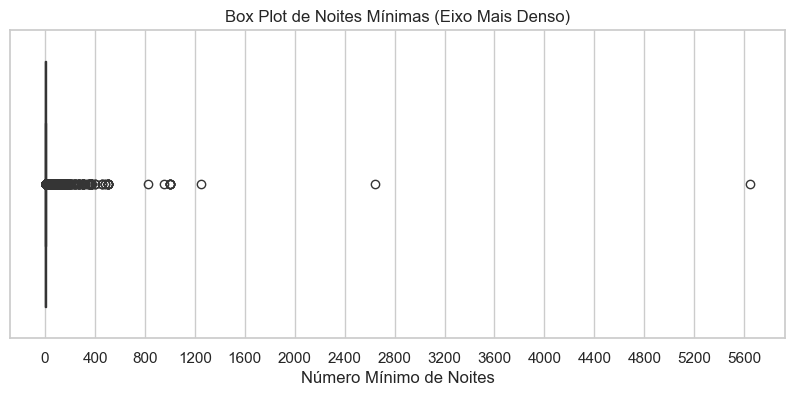

In [59]:
plt.figure(figsize=(10, 4))
sns.boxplot(x=df['minimum_nights'])
plt.title('Box Plot de Noites Mínimas (Eixo Mais Denso)')
plt.xlabel('Número Mínimo de Noites')

plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=20)) 

plt.show()

## 4. Exploração dos dados:

### 4.1 Matriz de confusão

Para entender quais variáveis numéricas têm a maior influência sobre o preço, analisamos a matriz de correlação. Um valor próximo de +1 ou -1 indica uma forte correlação linear (positiva ou negativa, respectivamente) com a nossa variável alvo.

Correlação das colunas numéricas com o preço:
price                             1.000000
service_fee                       0.999991
id                                0.006670
number_of_reviews                 0.005172
reviews_per_month                 0.004135
long                              0.003573
host_id                           0.003551
instant_bookable                  0.000590
calculated_host_listings_count   -0.001219
availability_365                 -0.003976
construction_year                -0.004039
host_identity_verified           -0.004257
lat                              -0.004424
minimum_nights                   -0.005039
review_rate_number               -0.005511
has_house_rules                  -0.005948
Name: price, dtype: float64


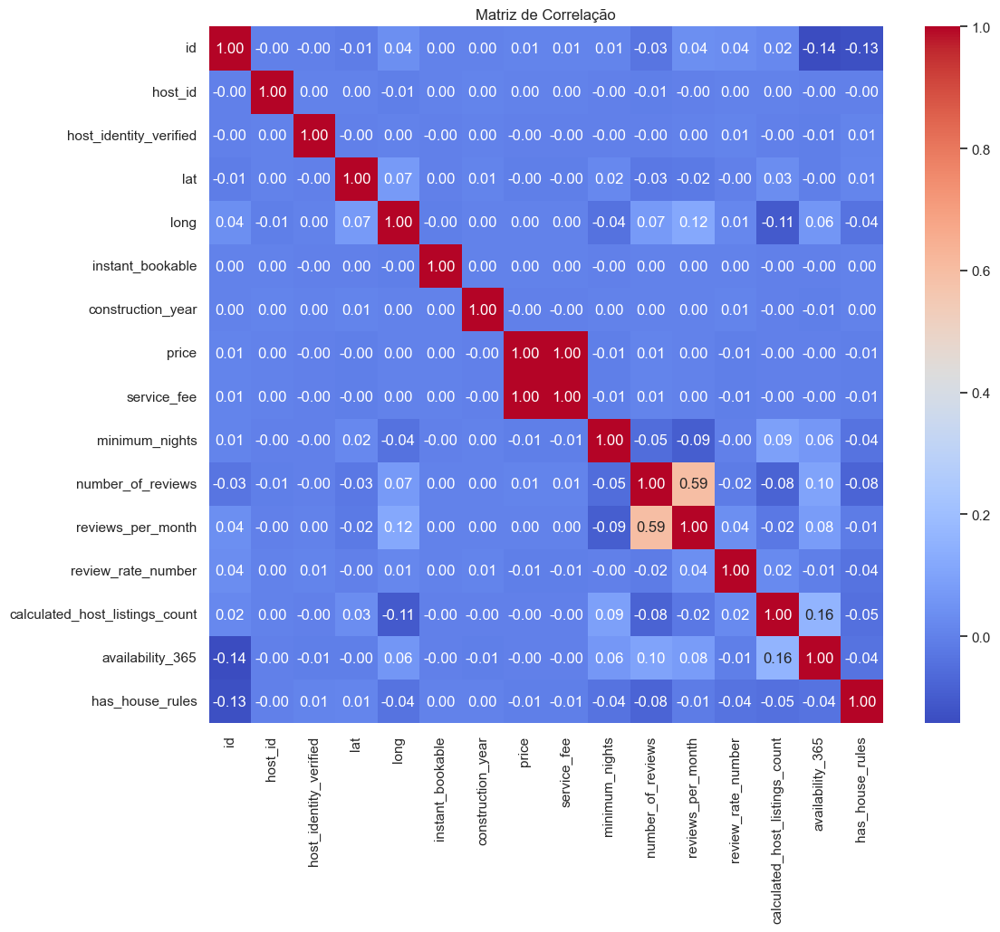

In [19]:
correlation_matrix = df.corr(numeric_only=True)

price_correlation = correlation_matrix['price'].sort_values(ascending=False)

print("Correlação das colunas numéricas com o preço:")
print(price_correlation)

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlação")
plt.show()

A partir da matriz de correlação, é possível observar as seguintes relações com o `price`:

* **Correlações Fortes:** As variáveis com maior correlação positiva são `service_fee`, `number_of_reviews` e `reviews_per_month`.

* **Correlação Enganosa (Espúria):** A coluna `ID` também aparenta ter uma correlação relevante. No entanto, desconsideramos essa análise, pois o `ID` é apenas um identificador único e não uma característica real do imóvel. Esse tipo de correlação é considerado espúrio e não tem valor preditivo.

A matriz de correlação analisa apenas as colunas numéricas. A seguir, utilizaremos outra abordagem para estimar a importância das features categóricas.

### 4.2 Ranking de Features com Modelo RandomForest

A matriz de correlação é útil, mas limitada a variáveis numéricas e a relações lineares. Para uma análise mais completa e robusta, utilizamos um modelo RandomForestRegressor. Este método consegue avaliar o poder preditivo de todas as features (numéricas e categóricas, como room_type e neighbourhood) em conjunto.

Devido a limitações computacionais, foi feita uma pré-seleção das colunas mais promissoras para a análise. O objetivo foi focar o processamento nos atributos que, por hipótese, têm maior influência sobre o preço.

Carregando modelo existente de ./assets...

As 20 features mais importantes:
                              Feature  Importance
1                                long    0.260635
0                                 lat    0.253324
3                   number_of_reviews    0.153229
2                      minimum_nights    0.078083
4                  review_rate_number    0.067206
237            room_type_Private room    0.023236
239              has_house_rules_True    0.022766
233             instant_bookable_True    0.019376
5         host_identity_verified_True    0.019038
234      cancellation_policy_moderate    0.017135
235        cancellation_policy_strict    0.016171
238             room_type_Shared room    0.004674
22   neighbourhood_Bedford-Stuyvesant    0.002303
226        neighbourhood_Williamsburg    0.002178
37             neighbourhood_Bushwick    0.001539
139             neighbourhood_Midtown    0.001537
61        neighbourhood_Crown Heights    0.001525
6        neighbourhood_

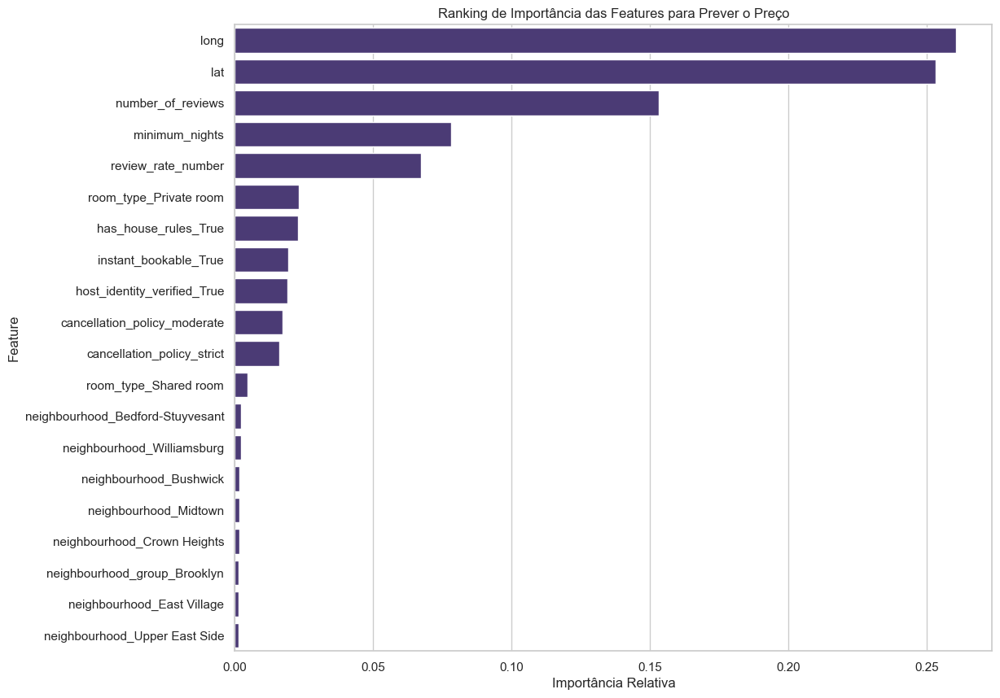

In [60]:
model_path = './assets/feature_importance_model.joblib'
columns_path = './assets/model_columns.joblib'
assets_dir = './assets'

colunas_para_analise = [
    'host_identity_verified', 'neighbourhood_group', 'neighbourhood', 
    'instant_bookable', 'cancellation_policy', 'room_type', 'has_house_rules',
    'lat', 'long', 'minimum_nights', 'number_of_reviews', 'review_rate_number',
    'price' 
]

df_modelo = df[colunas_para_analise].copy()

X = df_modelo.drop('price', axis=1)
y = df_modelo['price']

colunas_categoricas = X.select_dtypes(include=['object', 'bool']).columns
X_encoded = pd.get_dummies(X, columns=colunas_categoricas, drop_first=True)

if not os.path.exists(assets_dir):
    os.makedirs(assets_dir)

if os.path.exists(model_path):
    print("Carregando modelo existente de ./assets...")
    model = joblib.load(model_path)
    model_columns = joblib.load(columns_path)
    X_encoded = X_encoded.reindex(columns=model_columns, fill_value=0)
else:
    print("Modelo não encontrado. Treinando um novo modelo...")
    model = RandomForestRegressor(n_estimators=50, random_state=42, n_jobs=-1)
    model.fit(X_encoded, y)
    print("Salvando o modelo treinado em ./assets...")
    joblib.dump(model, model_path)
    joblib.dump(X_encoded.columns, columns_path)

importances = model.feature_importances_
feature_names = X_encoded.columns

feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\nAs 20 features mais importantes:")
print(feature_importance_df.head(20))

plt.figure(figsize=(12, 10))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(20))
plt.title('Ranking de Importância das Features para Prever o Preço')
plt.xlabel('Importância Relativa')
plt.ylabel('Feature')
plt.show()

### 4.3 Características Gerais dos Anúncios

Nesta seção, foi realizada uma análise para identificar os nomes de anúncios mais comuns no dataset, com o objetivo de entender os padrões de nomenclatura e a qualidade dos dados nesta coluna.'

#### Top 10 Nomes de Anúncios Mais Comuns

**Metodologia:**

O processo consistiu em contar a frequência de cada valor único na coluna `name` utilizando a função `value_counts()`. Em seguida, os 10 nomes mais frequentes foram selecionados e visualizados em um gráfico de barras horizontais para facilitar a comparação.

**Principais Observações:**

* **Dado Faltante ou Padrão:** O "nome" mais comum, com uma frequência superior a 220 ocorrências, é **"Sem nome informado"**. Isso indica que uma quantidade significativa de anúncios não possui um título personalizado, o que representa uma importante observação sobre a qualidade dos dados desta coluna.
* **Distribuição Assimétrica:** Há uma grande disparidade entre o primeiro colocado e os demais. Enquanto o nome padrão lidera com folga, os outros nove nomes mais comuns têm uma frequência muito menor (todos abaixo de 40), sugerindo que a maioria dos nomes de anúncios é bastante diversificada.
* **Nomes Genéricos:** Vários dos nomes populares são genéricos e descritivos, como "Home away from home", "Private Room" e "Brooklyn Apartment", refletindo o tipo de acomodação oferecida.

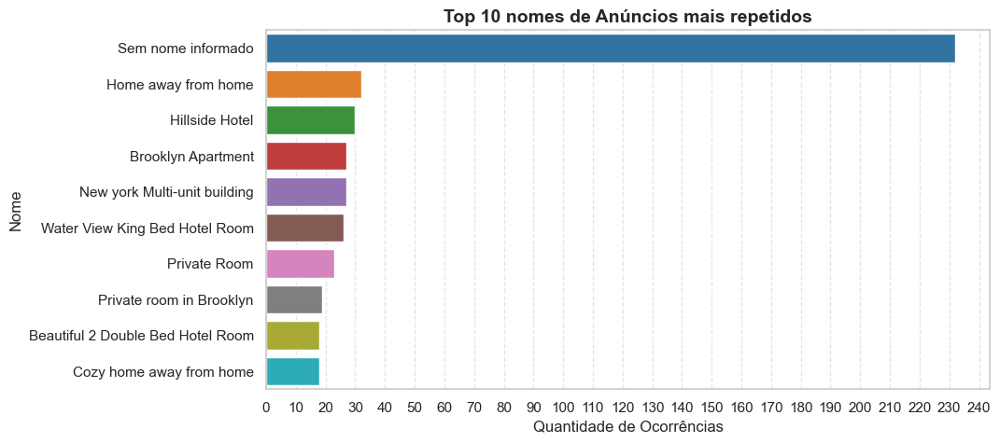

In [21]:
top_names = df['name'].value_counts().head(10)

plt.figure(figsize=(10,5))
ax = sns.barplot(
    x=top_names.values, 
    y=top_names.index, 
    hue=top_names.index,
    dodge=False,
    legend=False,
    palette="tab10"
)

plt.title('Top 10 nomes de Anúncios mais repetidos', fontsize=14, fontweight='bold')
plt.xlabel('Quantidade de Ocorrências', fontsize=12)
plt.ylabel('Nome', fontsize=12)
ax.xaxis.set_major_locator(MaxNLocator(nbins=30))
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.show()

#### Proporção de Nomes de Anúncios Únicos vs. Repetidos 

A análise de frequência revela que muitos nomes de anúncios se repetem. À primeira vista, isso poderia sugerir que se tratam dos mesmos imóveis, mas, como veremos na análise geográfica a seguir, os anúncios com nomes idênticos estão, na verdade, em localidades distintas.

Isso nos leva a concluir que a alta repetição se deve ao uso de nomes genéricos por diferentes anfitriões. Além disso, o problema é potencializado por pequenas variações de formatação, como o uso de letras maiúsculas ou minúsculas (ex: 'Brooklyn Apartment' vs. 'brooklyn apartment'), que são contadas como nomes diferentes.

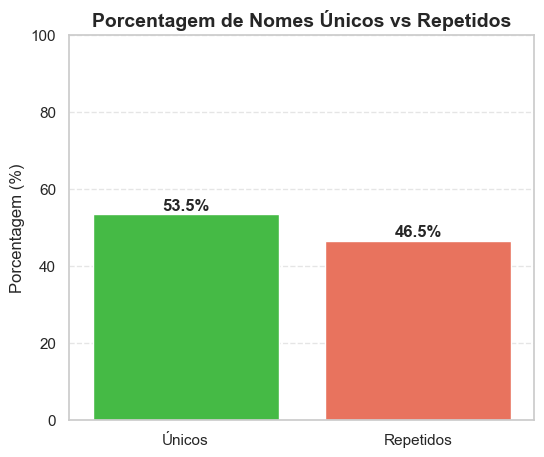

In [22]:
name_counts = df['name'].value_counts()
unique_count = (name_counts == 1).sum()
repeated_count = (name_counts > 1).sum()

cats = ['Únicos', 'Repetidos']
vals = [unique_count / len(name_counts) * 100, repeated_count / len(name_counts) * 100]

plt.figure(figsize=(6,5))
ax = sns.barplot(x=cats, y=vals, hue=cats, dodge=False, legend=False, palette=['limegreen', 'tomato'])

plt.title('Porcentagem de Nomes Únicos vs Repetidos', fontsize=14, fontweight='bold')
plt.ylabel('Porcentagem (%)', fontsize=12)

for i, v in enumerate(vals):
    ax.text(i, v + 1, f"{v:.1f}%", ha='center', fontweight='bold')

plt.ylim(0, 100)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


## 4.2 Análise Geográfica

### Identificação dos Bairros presentes

In [23]:
bairros_unicos = df['neighbourhood_group'].unique()
print(list(bairros_unicos))

['Brooklyn', 'Manhattan', 'Queens', 'Bronx', 'Staten Island']


Ao inspecionar os grupos de bairros, percebemos que existem 6 categorias únicas. No entanto, identificamos uma inconsistência clara nos dados:

- O grupo de bairro `'brookln'` deveria claramente ser `'Brooklyn'`.
- Da mesma forma, `'manhatan'` deveria ser `'Manhattan'`.

O gráfico de barras a seguir, gerado com os dados brutos, ilustra visualmente esse problema. Essa correção será aplicada em uma etapa posterior de tratamento dos dados para garantir a integridade da análise.

### Quantidade de Anúncios por Grupo de Bairro

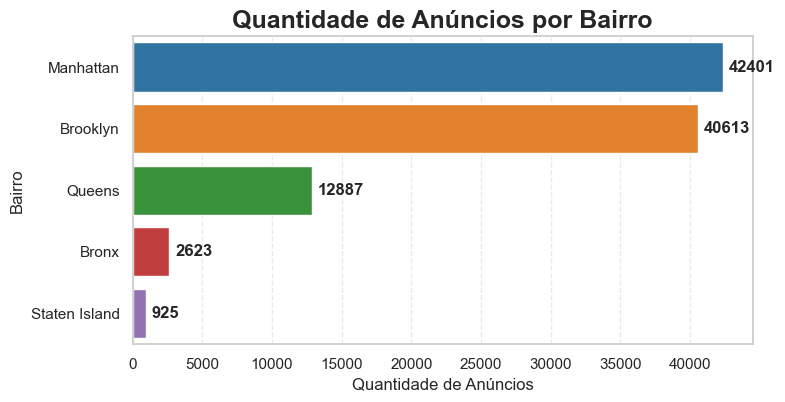

In [24]:
feq = df['neighbourhood_group'].value_counts()

plt.figure(figsize=(8,4))
ax = sns.barplot(
    x=feq.values, 
    y=feq.index, 
    hue=feq.index, 
    dodge=False, 
    legend=False, 
    palette="tab10"
)

plt.title("Quantidade de Anúncios por Bairro", fontsize=18, fontweight='bold')
plt.xlabel('Quantidade de Anúncios', fontsize=12)
plt.ylabel('Bairro', fontsize=12)

for i, v in enumerate(feq.values):
    ax.text(v + feq.max()*0.01, i, str(v), va='center', fontweight='bold')

plt.grid(axis='x', linestyle='--', alpha=0.4)
plt.show()


### Quantidade de Sub-Regiões dentro de um Bairro

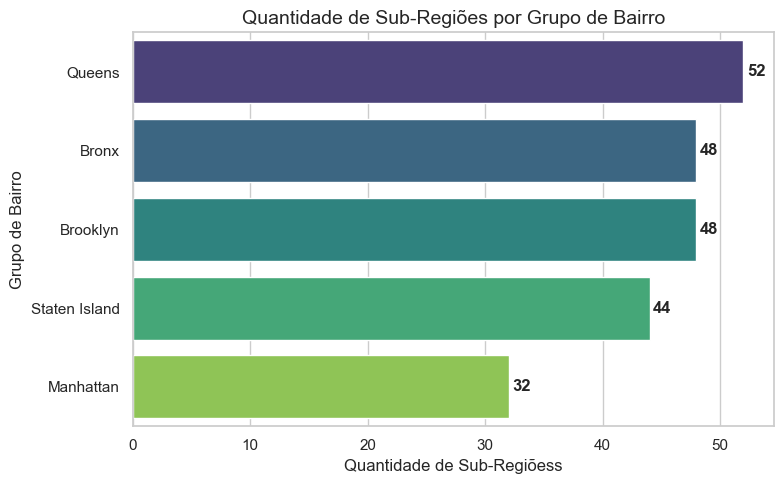

In [25]:
contagem = df.groupby("neighbourhood_group")["neighbourhood"].nunique().reset_index()
contagem.columns = ["Grupo de Bairro", "Qtd. de Sub-Bairros"]
contagem = contagem.sort_values("Qtd. de Sub-Bairros", ascending=False)

plt.figure(figsize=(8,5))
ax = sns.barplot(
    data=contagem,
    x='Qtd. de Sub-Bairros',
    y='Grupo de Bairro',
    hue="Grupo de Bairro",
    dodge=False,
    legend=False,
    palette="viridis"
)

ax.set_title("Quantidade de Sub-Regiões por Grupo de Bairro", fontsize=14)
ax.set_xlabel("Quantidade de Sub-Regiõess", fontsize=12)
ax.set_ylabel("Grupo de Bairro", fontsize=12)

for p in ax.patches:
    width = p.get_width()
    y = p.get_y() + p.get_height() / 2
    ax.text(width + 0.3, y, f"{int(width)}", va="center", ha="left", fontweight='bold')

plt.tight_layout()
plt.show()

### Distribuição Espacial dos Anúncios pelo Planeta

Loading formatted geocoded file...


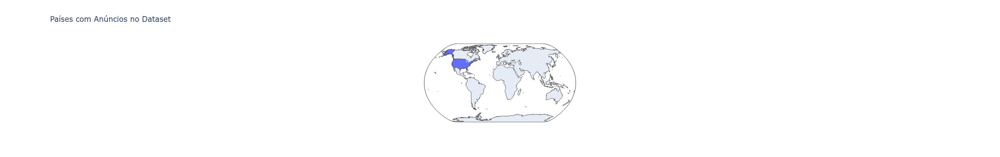

In [26]:
coords = list(zip(df['lat'], df['long']))
results = rg.search(coords)
unique_country_codes = {result['cc'] for result in results}

def get_iso3_code(code_2_letter):
    try:
        return pycountry.countries.get(alpha_2=code_2_letter).alpha_3
    except AttributeError:
        return None

def get_country_name(code_2_letter):
    try:
        return pycountry.countries.get(alpha_2=code_2_letter).name
    except AttributeError:
        return None

df_mapa = pd.DataFrame({'code_2': list(unique_country_codes)})
df_mapa['Codigo_ISO'] = df_mapa['code_2'].apply(get_iso3_code)
df_mapa['Pais'] = df_mapa['code_2'].apply(get_country_name)
df_mapa.dropna(inplace=True)

fig = pxa.choropleth(
    df_mapa,
    locations="Codigo_ISO",
    color="Pais",
    hover_name="Pais",
    projection="natural earth",
    title="Países com Anúncios no Dataset"
)

fig.update_layout(showlegend=False)
fig.show()

### Distribuição Espacial e de Densidade dos Anúncios pelo Estados Unidos

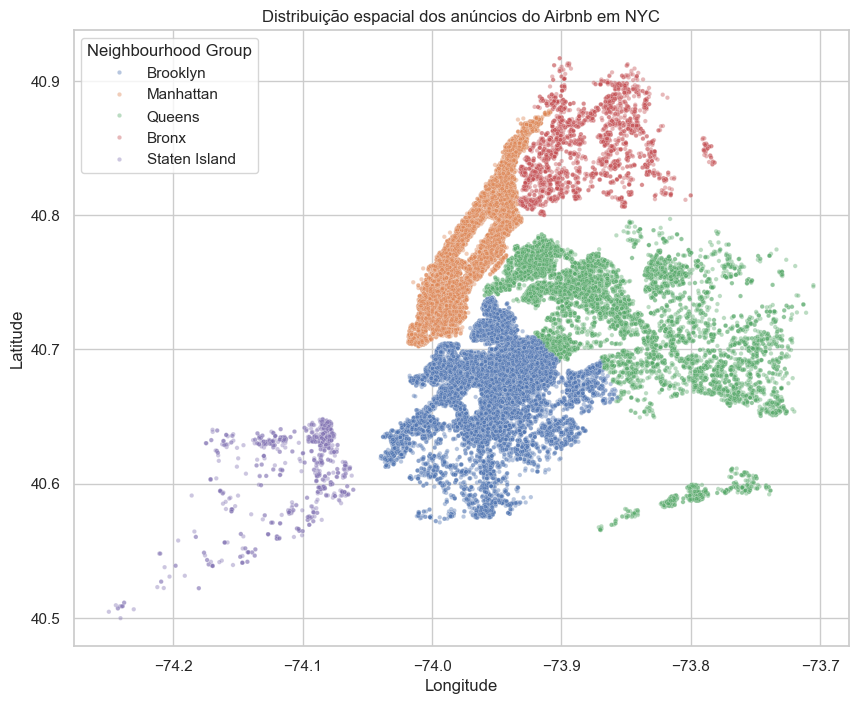

In [27]:
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x="long", 
    y="lat", 
    data=df, 
    hue="neighbourhood_group",
    alpha=0.4,
    s=10
)

plt.title("Distribuição espacial dos anúncios do Airbnb em NYC")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Neighbourhood Group")
plt.show()


In [28]:
map_data = df.dropna(subset=['lat', 'long'])

nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

heat_data = [[row['lat'], row['long']] for index, row in map_data.iterrows()]
HeatMap(heat_data, radius=15).add_to(nyc_map)

title_html = '''
             <h3 align="center" style="font-size:16px"><b>Densidade de Anúncios do Airbnb em NYC</b></h3>
             '''
nyc_map.get_root().html.add_child(folium.Element(title_html))

nyc_map

### Distribuição Espacial dos Anúncios por Sub-Região

In [29]:
geojson_path = "assets/nyc.geojson"
regioes = gpd.read_file(geojson_path).to_crs("EPSG:4326").reset_index().rename(columns={"index":"id_poligono"})

pontos = df.dropna(subset=["lat","long"])[["lat","long"]]
pontos = gpd.GeoDataFrame(pontos, geometry=gpd.points_from_xy(pontos["long"], pontos["lat"]), crs="EPSG:4326")

juncao = gpd.sjoin(pontos, regioes, how="inner", predicate="within")
contagem = juncao.groupby("id_poligono").size().reset_index(name="anuncios")

regioes = regioes.merge(contagem, on="id_poligono", how="left")
regioes["anuncios"] = regioes["anuncios"].fillna(0).astype(int)

boroughs_validos = sorted(regioes.loc[regioes["anuncios"]>0, "BoroName"].dropna().unique())
cmap = plt.colormaps.get_cmap("tab10")
cores_borough = {b: mcolors.rgb2hex(cmap(i/len(boroughs_validos))) for i, b in enumerate(boroughs_validos)}

def estilo(f):
    a = f["properties"].get("anuncios", 0)
    b = f["properties"].get("BoroName")
    if a>0 and b in cores_borough:
        return {"fillColor": cores_borough[b], "color": "black", "weight": 1, "fillOpacity": 0.7, "opacity": 1}
    return {"fillColor": "transparent", "color": "transparent", "weight": 0, "fillOpacity": 0, "opacity": 0}

def destaque(f):
    a = f["properties"].get("anuncios", 0)
    b = f["properties"].get("BoroName")
    cor = cores_borough.get(b, "#cccccc")
    return {"weight": 3, "fillColor": cor, "fillOpacity": 0.9 if a>0 else 0}

mapa = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
folium.GeoJson(
    regioes,
    tooltip=folium.GeoJsonTooltip(
        fields=[c for c in ["BoroName","NTAName","anuncios"] if c in regioes.columns],
        aliases=["Bairro","Sub-região","Anúncios"]
    ),
    style_function=estilo,
    highlight_function=destaque
).add_to(mapa)
mapa


## 4.3 Tipos de Acomodação

### Tipos presentes no Dataset

In [30]:
list(df["room_type"].unique())

['Private room', 'Entire home/apt', 'Shared room', 'Hotel room']

### Distribuição Percentual dos Tipos de Quarto no Dataset inteiro

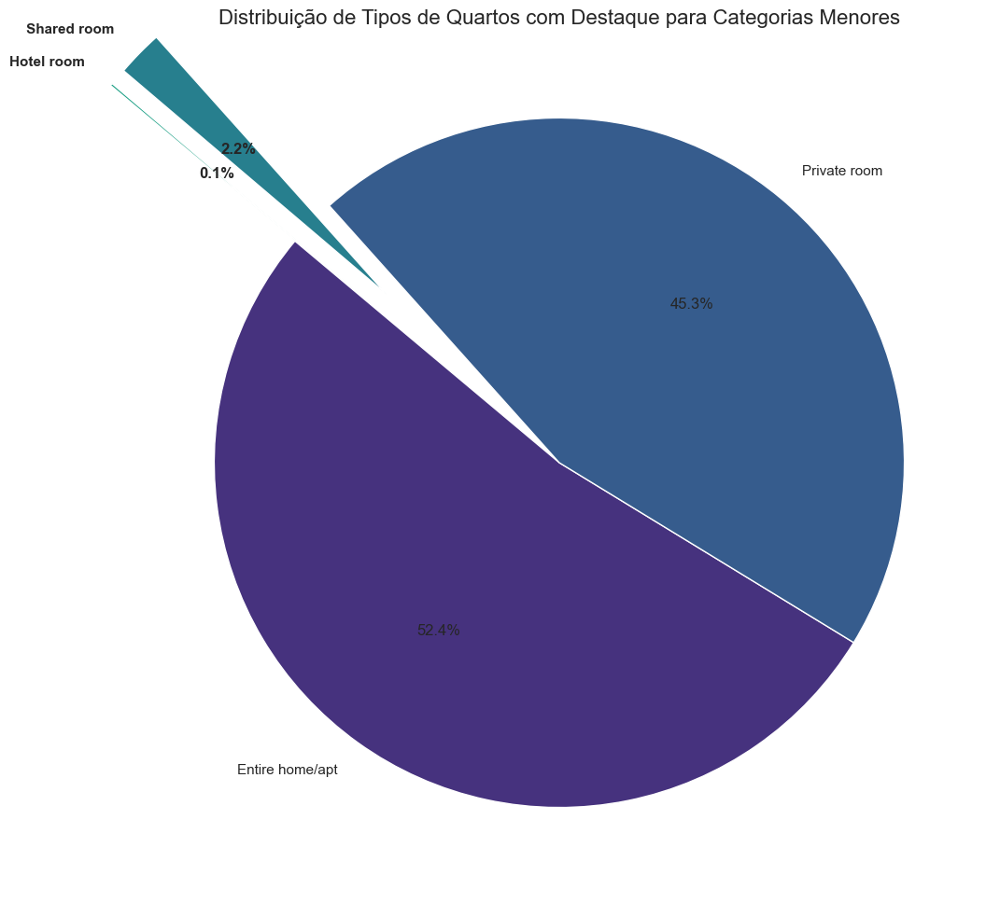

In [31]:
room_type_counts = df['room_type'].value_counts()
labels = room_type_counts.index

limite_percentual = 10.0

porcentagens = 100. * room_type_counts / room_type_counts.sum()

explode = [0.7 if p < limite_percentual else 0 for p in porcentagens]

sns.set_style("whitegrid")
sns.set_palette("viridis")
plt.figure(figsize=(12, 12))

wedges, texts, autotexts = plt.pie(
    room_type_counts,
    autopct='%1.1f%%',
    startangle=140,
    labels=labels,
    explode=explode
)

for i, p in enumerate(porcentagens):
    if p < limite_percentual:
        texts[i].set_fontweight('bold')
        autotexts[i].set_fontweight('bold')

plt.title('Distribuição de Tipos de Quartos com Destaque para Categorias Menores', fontsize=16)
plt.ylabel('')
plt.show()

### Distribuição Percentual dos Tipos de Quarto por Grupo de Bairro

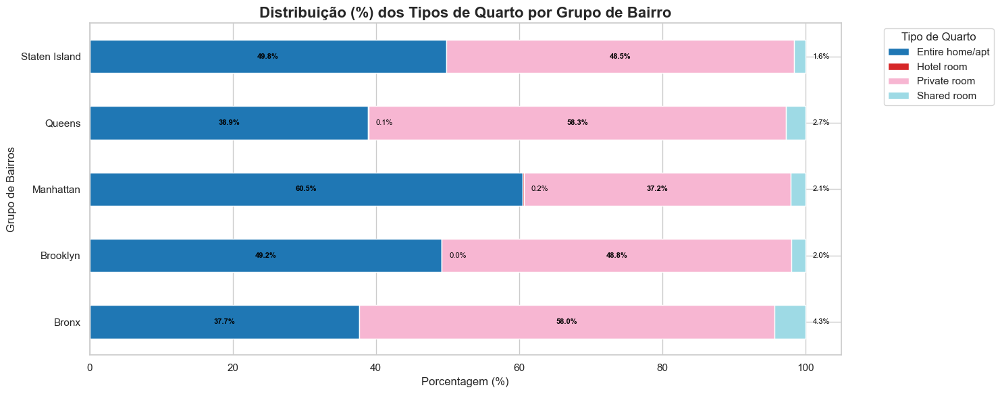

In [32]:
freq = df.groupby(["neighbourhood_group", "room_type"]).size().reset_index(name="count")
freq["percent"] = freq.groupby("neighbourhood_group")["count"].transform(lambda x: x / x.sum() * 100)

pivot = freq.pivot(index="neighbourhood_group", columns="room_type", values="percent").fillna(0)

ax = pivot.plot(
    kind="barh",
    stacked=True,
    figsize=(15, 6),
    colormap="tab20"
)

plt.title("Distribuição (%) dos Tipos de Quarto por Grupo de Bairro", fontsize=16, fontweight="bold")
plt.xlabel("Porcentagem (%)", fontsize=12)
plt.ylabel("Grupo de Bairros", fontsize=12)
plt.legend(title="Tipo de Quarto", bbox_to_anchor=(1.05, 1), loc="upper left")

for bar in ax.patches:
    width = bar.get_width()
    if width > 0:
        x = bar.get_x() + width / 2
        y = bar.get_y() + bar.get_height() / 2
        label = f"{width:.1f}%"
        if width > 8:
            ax.text(x, y, label, ha="center", va="center", fontsize=8, color="black", fontweight="bold")
        else:
            ax.text(bar.get_x() + width + 1, y, label, ha="left", va="center", fontsize=8, color="black")

plt.tight_layout()
plt.show()


## 4.4 Análise de Preços

### Distribuição do preço ao longo do Dataset

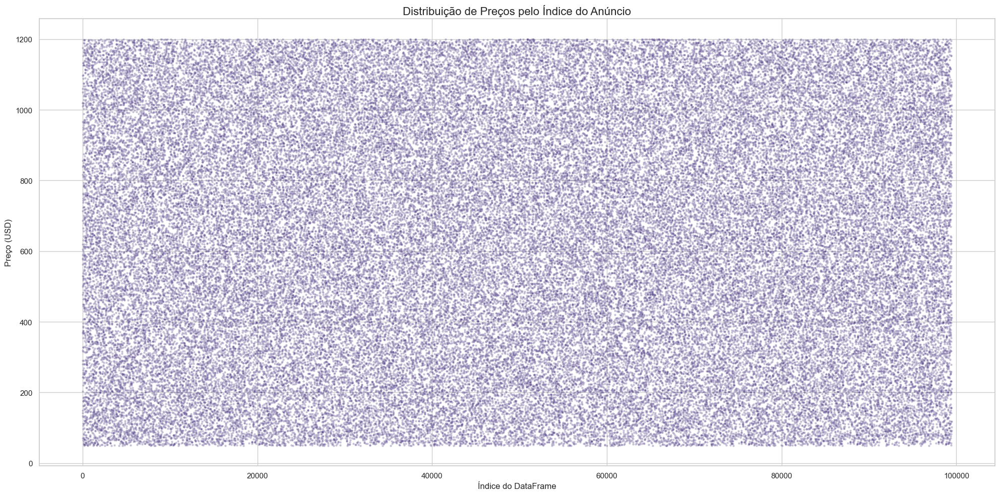

In [33]:
plt.figure(figsize=(20, 10))

ax = sns.scatterplot(
    x=df.index,
    y=df['price'],
    alpha=0.3,
    s=10
)

ax.set_title('Distribuição de Preços pelo Índice do Anúncio', fontsize=16)
ax.set_xlabel('Índice do DataFrame', fontsize=12)
ax.set_ylabel('Preço (USD)', fontsize=12)
ax.grid(True)

plt.tight_layout()
plt.show()

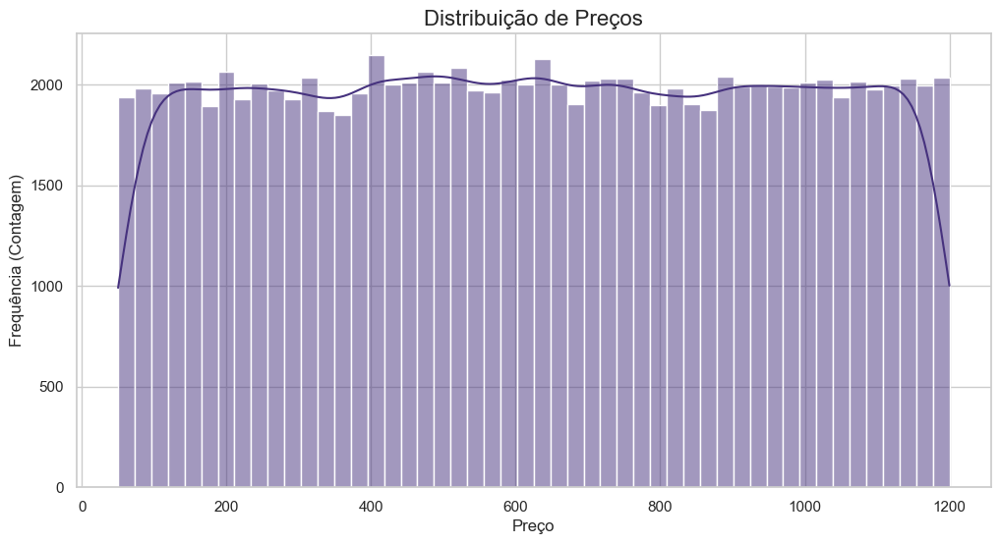

In [34]:
plt.figure(figsize=(12, 6))

sns.histplot(df['price'], kde=True, bins=50)

plt.title('Distribuição de Preços', fontsize=16)
plt.xlabel('Preço', fontsize=12)
plt.ylabel('Frequência (Contagem)', fontsize=12)
plt.show()

### Preço Médio por Região, detalhado por Tipo de Quarto

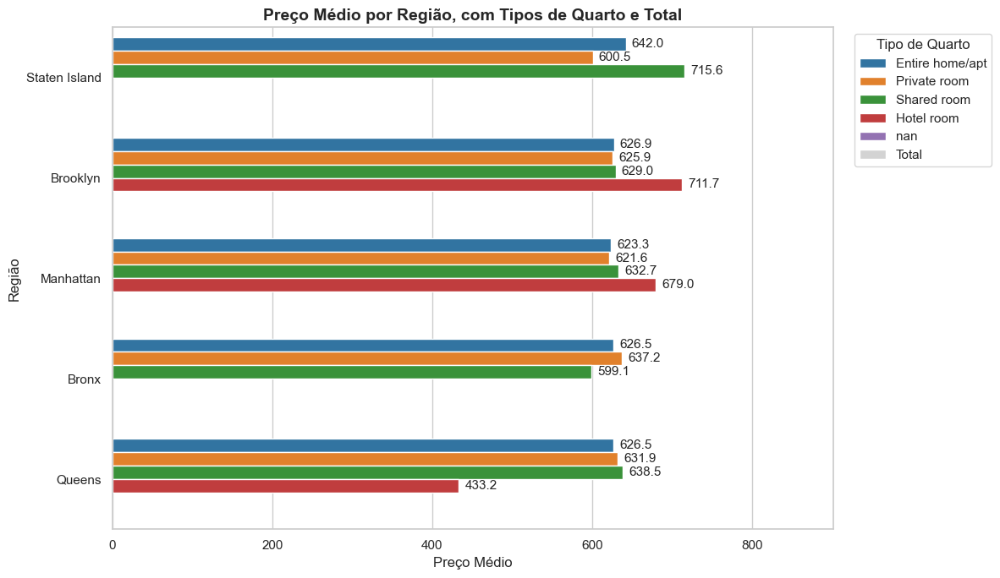

In [35]:
preco_por_tipo = df.groupby(["neighbourhood_group","room_type"])["price"].mean().reset_index(name="PrecoMedio")
preco_total = df.groupby("neighbourhood_group")["price"].mean().reset_index(name="PrecoMedio").assign(**{"room type":"Total"})
tabela = pd.concat([preco_por_tipo, preco_total], ignore_index=True)

ordem_regioes = tabela.groupby("neighbourhood_group")["PrecoMedio"].mean().sort_values(ascending=False).index.tolist()
ordem_tipos = [t for t in tabela["room_type"].unique() if t!="Total"] + ["Total"]
cores = {**dict(zip(ordem_tipos[:-1], sns.color_palette("tab10", len(ordem_tipos)-1))), "Total":"lightgrey"}

plt.figure(figsize=(12,7))
ax = sns.barplot(data=tabela, x="PrecoMedio", y="neighbourhood_group",
                 hue="room_type", hue_order=ordem_tipos, order=ordem_regioes, dodge=True, palette=cores)

for container in ax.containers:
    for barra in container:
        valor = barra.get_width()
        if valor>0: 
            ax.text(valor+0.01*ax.get_xlim()[1], barra.get_y()+barra.get_height()/2, f"{valor:.1f}", va="center", fontsize=11)

ax.set_title("Preço Médio por Região, com Tipos de Quarto e Total", fontsize=14, fontweight="bold")
ax.set_xlabel("Preço Médio"); ax.set_ylabel("Região")
ax.legend(title="Tipo de Quarto", bbox_to_anchor=(1.02,1), loc="upper left")
ax.set_xlim(0, ax.get_xlim()[1]*1.2)
plt.tight_layout(); plt.show()


## Distribuição de Preços por Região e Tipo de Quarto

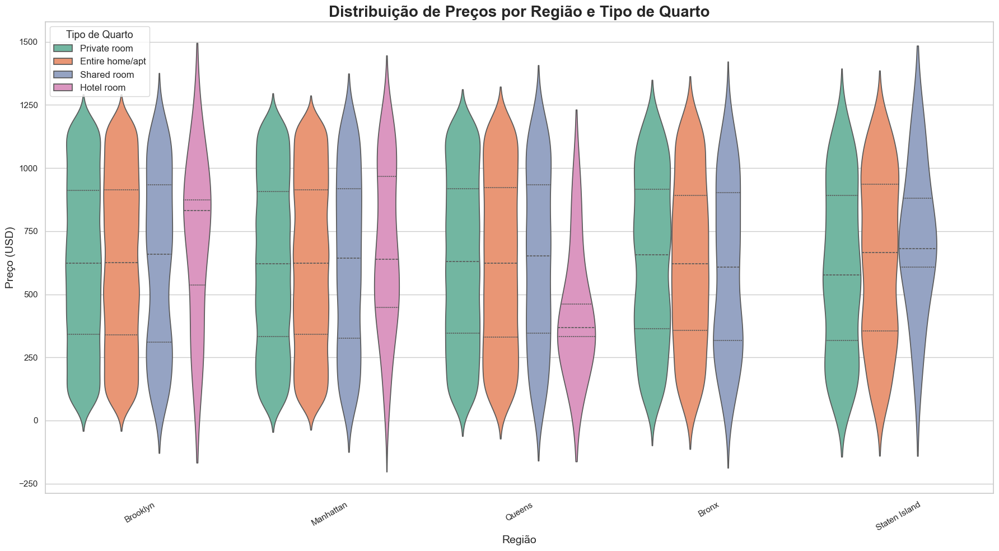

In [36]:
plt.figure(figsize=(18, 10))

ax = sns.violinplot(
    data=df,
    x="neighbourhood_group",
    y="price",
    hue="room_type",
    palette="Set2",
    inner="quartiles",
    dodge=True 
)

ax.set_title("Distribuição de Preços por Região e Tipo de Quarto", fontsize=20, fontweight="bold")
ax.set_xlabel("Região", fontsize=14)
ax.set_ylabel("Preço (USD)", fontsize=14)

plt.legend(title="Tipo de Quarto", fontsize=12, title_fontsize=13)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()


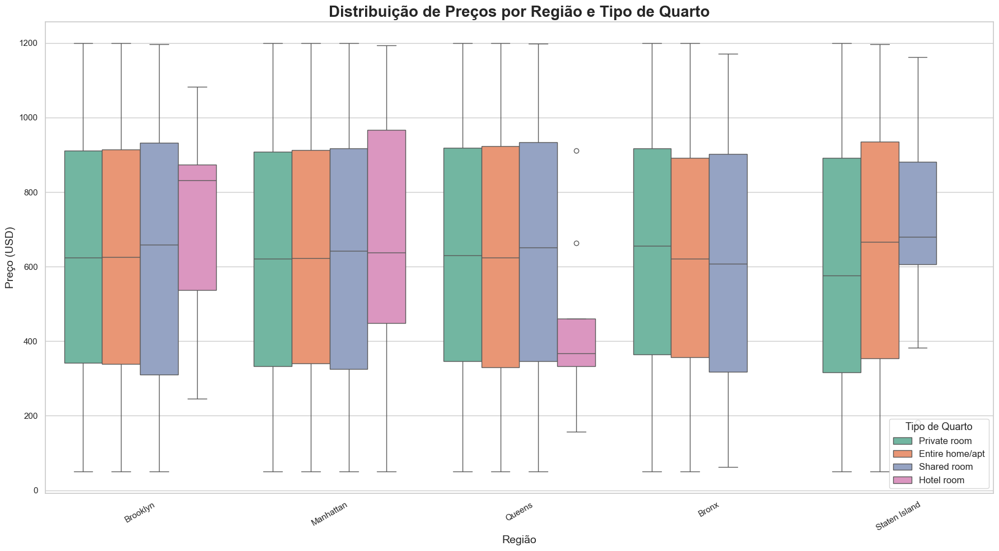

In [37]:
plt.figure(figsize=(18, 10))

ax = sns.boxplot(
    data=df,
    x="neighbourhood_group",
    y="price",
    hue="room_type",
    palette="Set2"
)

ax.set_title("Distribuição de Preços por Região e Tipo de Quarto", fontsize=20, fontweight="bold")
ax.set_xlabel("Região", fontsize=14)
ax.set_ylabel("Preço (USD)", fontsize=14)

plt.legend(title="Tipo de Quarto", fontsize=12, title_fontsize=13)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

### Relação entre Preço e Popularidade (Número de Avaliações)

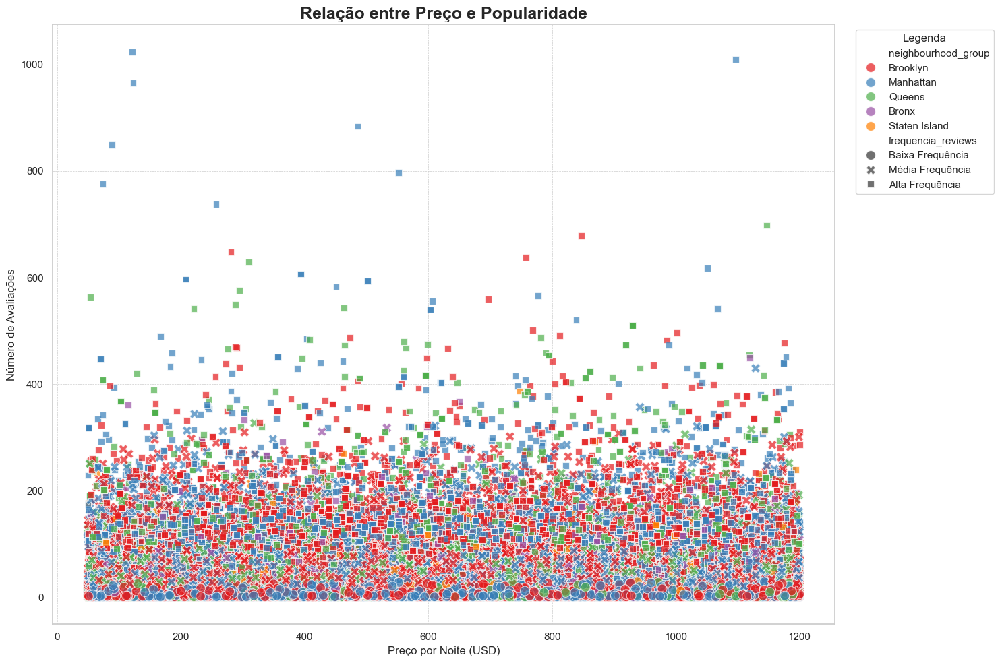

In [38]:
bins = [0, 1, 3, float('inf')]
labels = ['Baixa Frequência', 'Média Frequência', 'Alta Frequência']
df['frequencia_reviews'] = pd.cut(df['reviews_per_month'], bins=bins, labels=labels, right=False)

plt.figure(figsize=(15, 10))
ax = sns.scatterplot(
    data=df,
    x='price',
    y='number_of_reviews',
    hue='neighbourhood_group',
    style='frequencia_reviews',
    palette='Set1',
    alpha=0.7,
    s=100
)

ax.set_title('Relação entre Preço e Popularidade', fontsize=18, fontweight='bold')
ax.set_xlabel('Preço por Noite (USD)', fontsize=12)
ax.set_ylabel('Número de Avaliações', fontsize=12)
ax.legend(title='Legenda', bbox_to_anchor=(1.02, 1), loc='upper left')
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

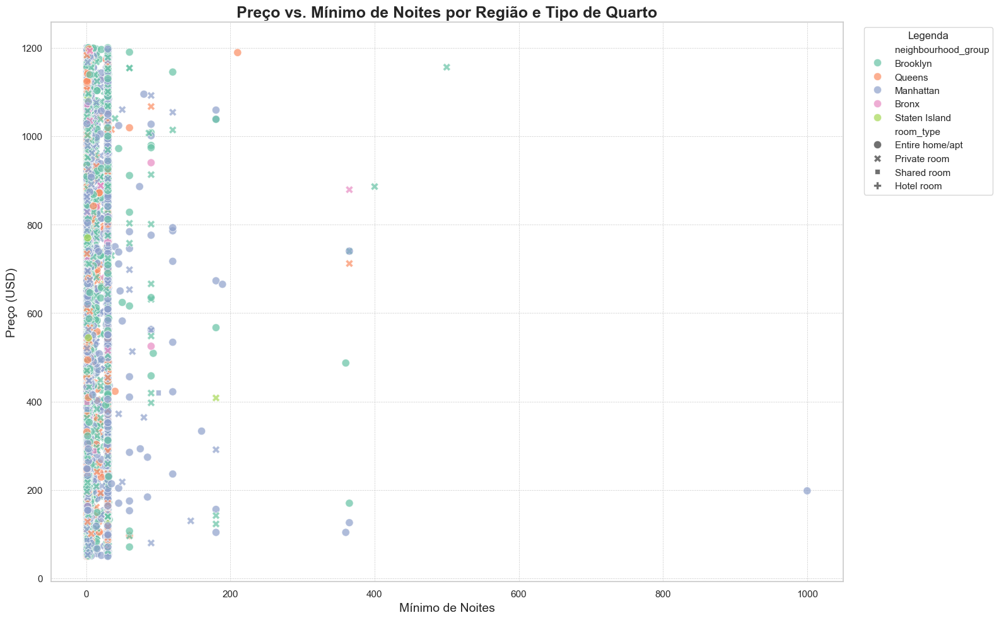

In [39]:
df_plot = df[(df['minimum_nights'] > 0) & (df['price'] > 0)].copy()

df_amostra = df_plot.sample(n=10000, random_state=42)

plt.figure(figsize=(16, 10))

ax = sns.scatterplot(
    data=df_amostra,
    x='minimum_nights',
    y='price',
    hue='neighbourhood_group',
    style='room_type',
    palette='Set2',
    alpha=0.7,
    s=80
)

ax.set_title('Preço vs. Mínimo de Noites por Região e Tipo de Quarto', fontsize=18, fontweight='bold')
ax.set_xlabel('Mínimo de Noites', fontsize=14)
ax.set_ylabel('Preço (USD)', fontsize=14)

ax.legend(title='Legenda', bbox_to_anchor=(1.02, 1), loc='upper left')
ax.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

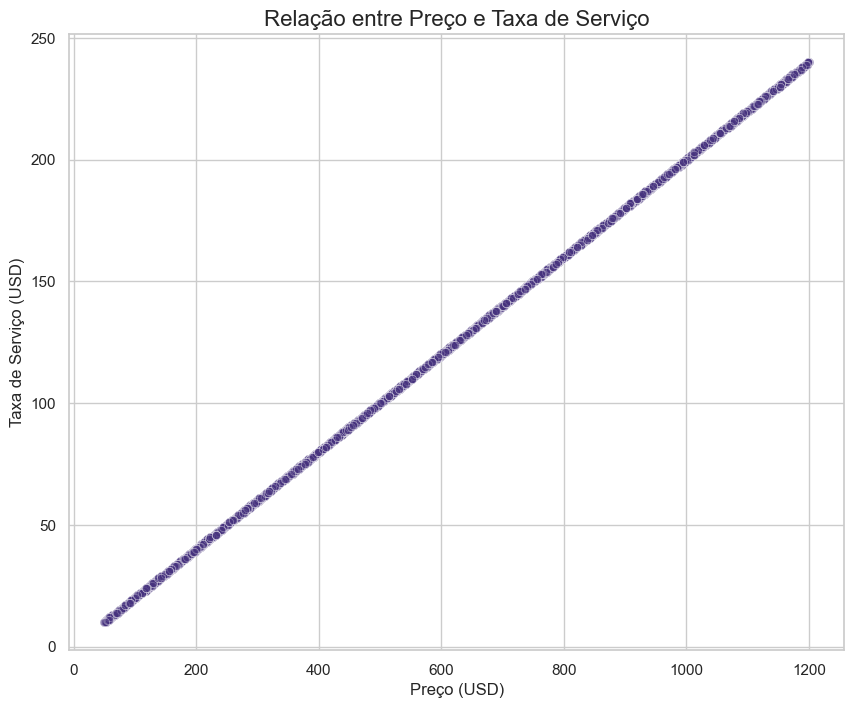

In [40]:
plt.figure(figsize=(10, 8))

sns.scatterplot(
    data=df,
    x='price',
    y='service_fee',
    alpha=0.5
)

plt.title('Relação entre Preço e Taxa de Serviço', fontsize=16)
plt.xlabel('Preço (USD)', fontsize=12)
plt.ylabel('Taxa de Serviço (USD)', fontsize=12)
plt.grid(True)

plt.show()

In [45]:
X = df['service_fee'].values.reshape(-1, 1)
y = df['price'].values

model = LinearRegression()
model.fit(X, y)

coeficiente = model.coef_[0]
intercepto = model.intercept_

print(f"price ≈ ({coeficiente:.4f} * service_fee) + {intercepto:.4f}")

price ≈ (4.9997 * service_fee) + 0.0332


In [46]:
X = df['price'].values.reshape(-1, 1)
y = df['service_fee'].values

model = LinearRegression()
model.fit(X, y)

coeficiente = model.coef_[0]
intercepto = model.intercept_

print(f"service_fee ≈ ({coeficiente:.4f} * price) + {intercepto:.4f}")

service_fee ≈ (0.2000 * price) + -0.0044


## 4.5 Políticas e Comportamento

Para cancelar uma reserva, sabemos que as regras para fazê-lo podem ser "estritas", "moderadas" ou "flexíveis". No entanto, não sabemos o que isso significa. O que quer dizer que as regras para cancelar um quarto são flexíveis? Qual a diferença de flexível para moderada?

O Gráfico abaixo visa demonstrar a distribuição das políticas de cancelamento entre os anúncios.

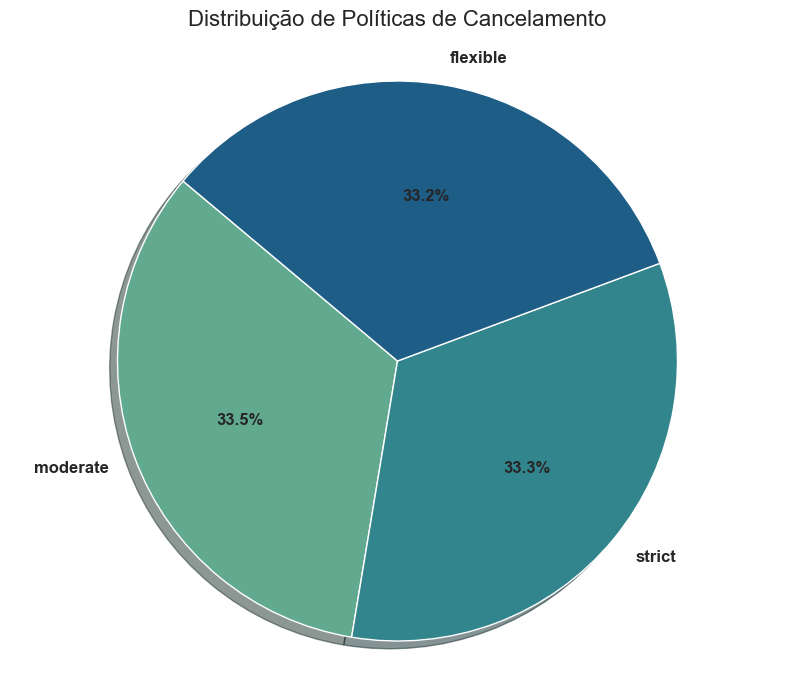

In [43]:
cancellation_counts = df['cancellation_policy'].dropna().value_counts()

sns.set_style("whitegrid")
plt.figure(figsize=(10, 8))

colors = sns.color_palette('crest', len(cancellation_counts))

plt.pie(
    cancellation_counts,
    labels=cancellation_counts.index,
    autopct='%1.1f%%',  
    startangle=140,      
    colors=colors,
    shadow=True,         
    textprops={'fontsize': 12, 'weight': 'bold'} 
)

plt.title('Distribuição de Políticas de Cancelamento', fontsize=16, pad=20)
plt.ylabel('') 
plt.axis('equal')  

plt.show()


Observamos que as três principais políticas de cancelamento – flexible, moderate e strict – estão distribuídas de maneira equilibrada, cada uma correspondendo a aproximadamente um terço do total de anúncios.

- Strict (Rígida): 33.3%
- Moderate (Moderada): 33.5%
- Flexible (Flexível): 33.2%

## Regras da casa Vs Avaliações

Para entender se a clareza nas regras influencia a satisfação do hóspede, investigamos se existe uma correlação entre a presença de regras da casa **(`house_rules`)** e as notas de avaliação. 
Dividimos os anúncios em dois grupos, com e sem regras definidas e comparamos a nota média de avaliação de cada um. 
O gráfico a seguir ilustra essa comparação, buscando identificar se anfitriões que definem regras tendem a receber notas mais altas.



## Regras da Casa

Para entender a frequência com que os anfitriões definem essas diretrizes, analisamos a coluna house_rules, verificando a proporção de anúncios que possuem este campo preenchido (não nulo) em comparação com os que não possuem (nulo).

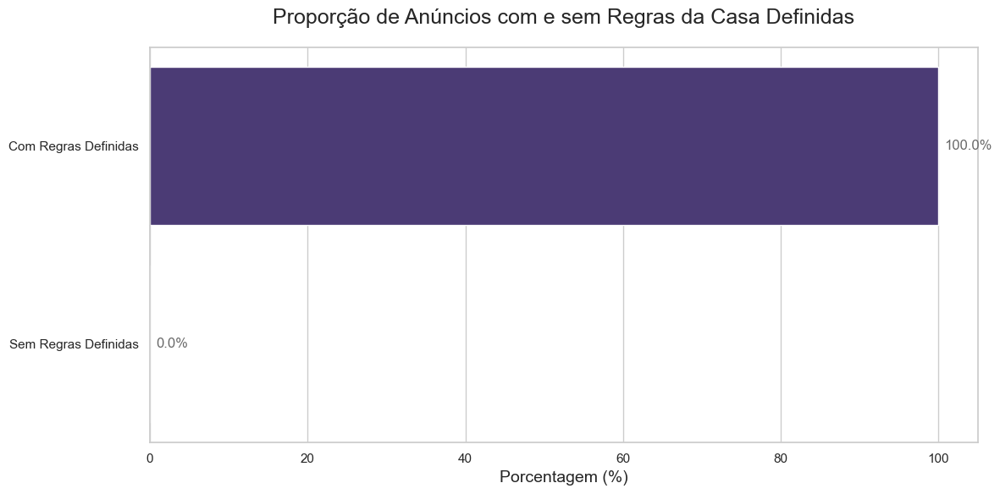

In [44]:
df_temp = df.copy()

df_temp['has_house_rules'] = df_temp['house_rules'].notna().map({True: 'Com Regras Definidas', False: 'Sem Regras Definidas'})
counts = df_temp['has_house_rules'].value_counts()

all_categories = ['Com Regras Definidas', 'Sem Regras Definidas']
counts = counts.reindex(all_categories, fill_value=0)

if counts.sum() > 0:
    percentages = (counts / counts.sum()) * 100
else:
    percentages = counts

sns.set_theme(style="whitegrid", palette="viridis")
plt.figure(figsize=(12, 6))

ax = sns.barplot(x=percentages.values, y=percentages.index)

plt.title('Proporção de Anúncios com e sem Regras da Casa Definidas', fontsize=18, pad=20)
plt.xlabel('Porcentagem (%)', fontsize=14)
plt.ylabel('')

ax.bar_label(ax.containers[0], fmt='%.1f%%', padding=5, fontsize=12, color='dimgray')

plt.xlim(0, 105)

plt.tight_layout()
plt.show()